<b><h1>DeepDream</h1></b>

This is a creative project using Google's pre-trained model of DeepDream. It allows to visualise patters that a neural network learns and therefore, produces interesting results to input images. 

DeepDream will over-enhance the patterns in an image using gradient ascent (instead of descent); images produced are almost dream like.

Layers of the network can be specified for extra importance, meaning they change the image depending on the layers you choose. I will explore this, including exploration of different covnets, and image types (e.g. natural and not).



<b><h1>Code</h1></b>

The code and some explanations will be used/gotten from https://www.tensorflow.org/tutorials/generative/deepdream#optional_scaling_up_with_tiles. It has a minimal implementation of DeepDream written by Alexander Mordvintsev. This will be used as the base, so after the model can be changed and images generated with different exadurated layers. As this is more of a creative project, I will focus on the final image result and which show the most interesting results. There will be an exploration here, and on a pdf alongside this project, there will be all of the generated images labelled with which layers and covnets were used to generate such results. 

Also, this site: https://www.mlq.ai/deep-dream-with-tensorflow-2-0/ was used to help with some of the code understanding. 


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import IPython.display as display
import PIL.Image
from tensorflow.keras.preprocessing import image
import time

For the image to be changed (and the first image is of a parrot, it is a test image just to decide which verion to use of the code provided on TensorFlow.org and mentioned above) The image itself was gotten from https://pixabay.com/ which provides royalty free stock images. The images I will use are on my github and are accessed here:

In [ ]:
url = 'https://github.com/SimasCes/DeepDream/blob/main/parrot.jpg?raw=true'

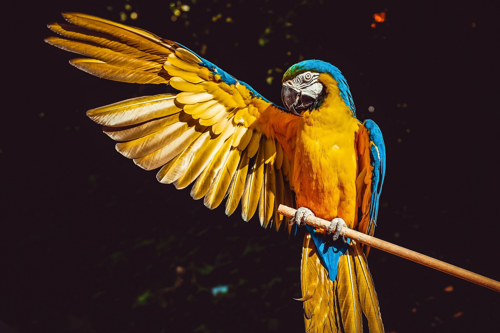

In [ ]:
# Download an image and read it into a NumPy array.
def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))


# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)
show(original_img)

This is where we download a pre-trained classification model. This is where different covnets can be used.

In [ ]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

In [ ]:
# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

The loss = sum of activations from chosen layers (names variable above). In gradient acent you want to maximise this value.

In [ ]:
def calc_loss(img, model):
  # Pass forward the image through the model to retrieve the activations.
  # Converts the image into a batch of size 1.
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return  tf.reduce_sum(losses)

Now you calcualte the gradients and add them to the image. 

In [ ]:
class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.float32),)
  )
  def __call__(self, img, steps, step_size):
      print("Tracing")
      loss = tf.constant(0.0)
      for n in tf.range(steps):
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img`
          # `GradientTape` only watches `tf.Variable`s by default
          tape.watch(img)
          loss = calc_loss(img, self.model)

        # Calculate the gradient of the loss with respect to the pixels of the input image.
        gradients = tape.gradient(loss, img)

        # Normalize the gradients.
        gradients /= tf.math.reduce_std(gradients) + 1e-8 

        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # You can update the image by directly adding the gradients (because they're the same shape!)
        img = img + gradients*step_size
        img = tf.clip_by_value(img, -1, 1)

      return loss, img

In [ ]:
deepdream = DeepDream(dream_model)

<b><h1>Simple</h1></b>
Main loop is below that runs the algorithm for DeepDream.

In [ ]:
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))


  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

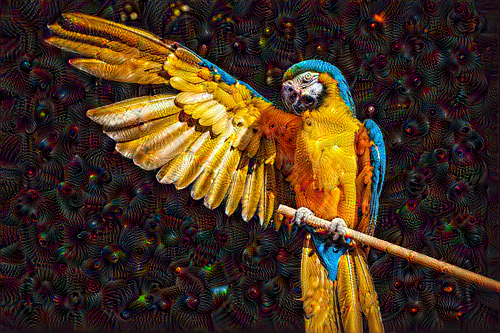

In [ ]:
dream_img = run_deep_dream_simple(img=original_img, 
                                  steps=100, step_size=0.01)

<b><h1>Octave</h1></b>
You can add an octave. It makes sure that the image is not noisy, low resolution, or and patters have different granularity. You can implement the previous approach, then increase the size of the image (octave). This is repeated.

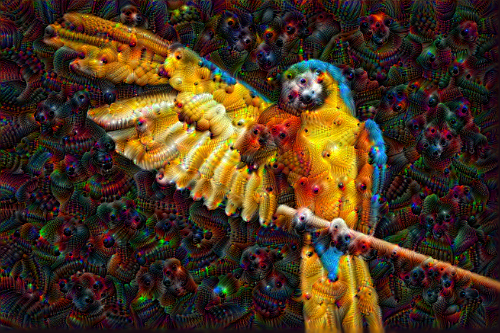

236.40856385231018

In [ ]:
import time
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The one below is the same, but the step size has been increased to see the image have more intensity. 

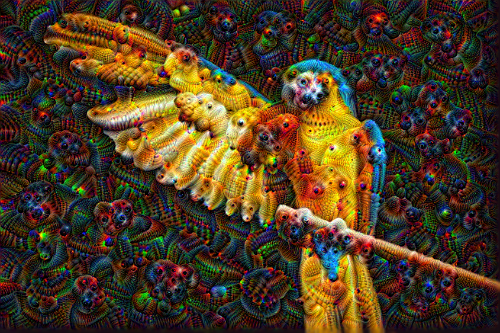

49.014517068862915

In [ ]:
import time
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=10, step_size=0.05)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

<b><h1>Tiles</h1></b>
Lastly, you can scale up with tiles. This is great for larger images as the image will be split into tiles, and a gradient will be implemented for each tile (more information on the approach found on https://www.tensorflow.org/tutorials/generative/deepdream#optional_scaling_up_with_tiles where the code was found for DeepDream).

In [ ]:
def random_roll(img, maxroll):
  # Randomly shift the image to avoid tiled boundaries.
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0,1])
  return shift, img_rolled

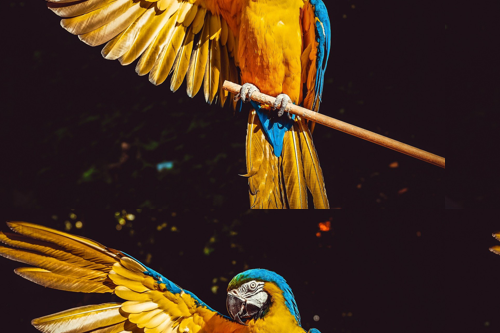

In [ ]:
shift, img_rolled = random_roll(np.array(original_img), 512)
show(img_rolled)

In [ ]:
class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    # Initialize the image gradients to zero.
    gradients = tf.zeros_like(img_rolled)

    # Skip the last tile, unless there's only one tile.
    xs = tf.range(0, img_rolled.shape[0], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_rolled.shape[1], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:
        # Calculate the gradients for this tile.
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img_rolled`.
          # `GradientTape` only watches `tf.Variable`s by default.
          tape.watch(img_rolled)

          # Extract a tile out of the image.
          img_tile = img_rolled[x:x+tile_size, y:y+tile_size]
          loss = calc_loss(img_tile, self.model)

        # Update the image gradients for this tile.
        gradients = gradients + tape.gradient(loss, img_rolled)

    # Undo the random shift applied to the image and its gradients.
    gradients = tf.roll(gradients, shift=-shift, axis=[0,1])

    # Normalize the gradients.
    gradients /= tf.math.reduce_std(gradients) + 1e-8 

    return gradients

In [ ]:
get_tiled_gradients = TiledGradients(dream_model)

In [ ]:
def run_deep_dream_with_octaves(img, steps_per_octave=100, step_size=0.01, 
                                octaves=range(-2,3), octave_scale=1.3):
  base_shape = tf.shape(img)
  img = tf.keras.preprocessing.image.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  for octave in octaves:
    # Scale the image based on the octave
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    img = tf.image.resize(img, tf.cast(new_size, tf.int32))

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print ("Octave {}, Step {}".format(octave, step))

  result = deprocess(img)
  return result

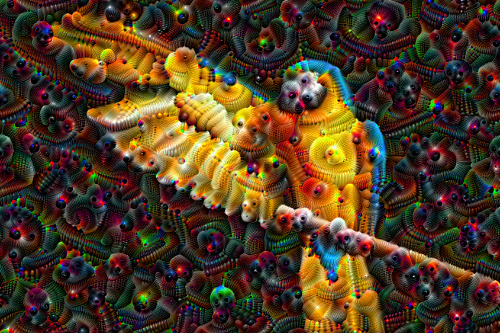

In [ ]:
img = run_deep_dream_with_octaves(img=original_img, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

<b><h1>First exploration</h1></b>

Overall, the last technique (scaling up with tiles) is very similar to the octaves technique. The octave result has more rought edges within the image or more grain, while the tiles tehnique has a more smooth effect.

The tiles technique however, takes a lot longer to run. They also are aimed at large images, and I do not have overly large images + my images will be made smaller to be seen well on the notebook. This is why I will try to use the octaves technique to experiemnt and might run the best images with the tiles technique at the end (as at the end due to this being a creative project I expect to have a few interesting images from the experimentations done).

<b><h1>Images</h1></b>

As I have chosen a technique, now I will choose some images that I will be running the algorithm on, and experimenting on. I have chosen to try this on 3 images: one natural, one urban, and one artistic. Due to straight lines used in the urban and interesting technique in the articstic I hypothesise there will be a difference in how there images look at the end.

Some explorations will be kept in the notebook however, there will be an extra pdf of all of the outcomes and what was used to gather these outcomes. It will act as almost a sketchbook for all of the results and will show all of the experimentations, plus make it cleaner to see the experiemntation and results without the code (as the code will be on this notebook).

These are the 3 images I chose (the variable name is the same, as they will be uploaded one at a time for the model anyway, this just makes the code more runable):

827392/823871 [==============================] - 0s 0us/step


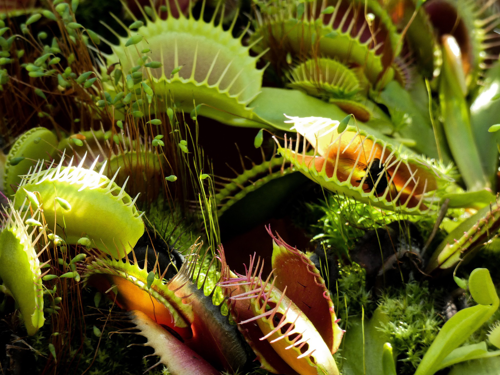

In [ ]:
original_img = download('https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true', max_dim=500)
show(original_img)

Image gotten from https://pixabay.com/ 

802816/802148 [==============================] - 0s 0us/step


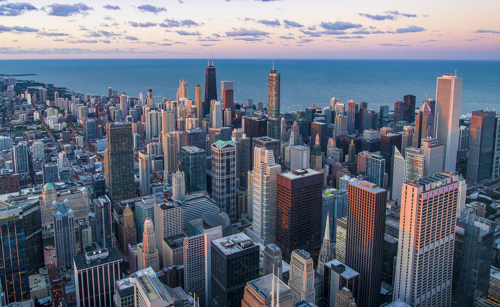

In [ ]:
original_img = download('https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true', max_dim=500)
show(original_img)

Image gotten from https://pixabay.com/ 

253952/248817 [==============================] - 0s 0us/step


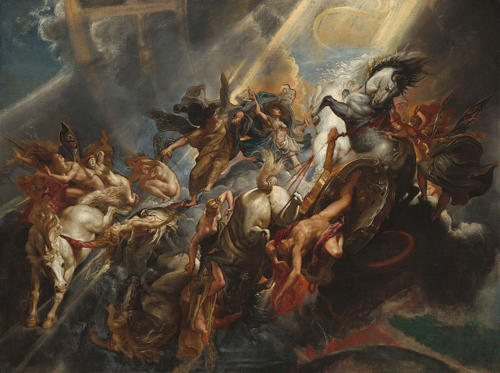

In [ ]:
original_img = download('https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true', max_dim=500)
show(original_img)

Image gotten from https://en.wikipedia.org/wiki/The_Fall_of_Phaeton_(Rubens)

<b><h1>STARTING </h1></b>

Eventhough I have already started, this will be the actual exploration with the 3 images. This is where my input comes in and where I change the variables and parameters of the convets themselves instead of using code. It will start with the basic model which was covnet = InceptionV3, layers = (mixed3, mixed5), octave scale = 1.30, step size = 0.01 (except for 1 trial), steps = 50.

There will be systematically explored to make each of the images interesting. I will test the same steps for all the images but will only keep a few images to not make the notebook extremely long. Instead, as mentioned before, a pdf will be made to keep all of the images and their parameters.

Also, I will now copy some of the code from before, it may be redundant but there is a very good reason for this. I will have to run the code many times. To avoid running many different cells the code has been conacatenated together, to make running them a lot easier and quicker.

base_model.summary() will also be used as then the layers of the model can be seen and chosen for personalisation/adjustment.

Code that defines functions so it can stay the same (you only have to run the imports from before):

In [ ]:
# Download an image and read it into a NumPy array.
def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))

def calc_loss(img, model):
  # Pass forward the image through the model to retrieve the activations.
  # Converts the image into a batch of size 1.
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return  tf.reduce_sum(losses)


class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.float32),)
  )
  def __call__(self, img, steps, step_size):
      print("Tracing")
      loss = tf.constant(0.0)
      for n in tf.range(steps):
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img`
          # `GradientTape` only watches `tf.Variable`s by default
          tape.watch(img)
          loss = calc_loss(img, self.model)

        # Calculate the gradient of the loss with respect to the pixels of the input image.
        gradients = tape.gradient(loss, img)

        # Normalize the gradients.
        gradients /= tf.math.reduce_std(gradients) + 1e-8 

        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # You can update the image by directly adding the gradients (because they're the same shape!)
        img = img + gradients*step_size
        img = tf.clip_by_value(img, -1, 1)

      return loss, img

<b><h1>Covnets/Models</h1></b>

There is a list of available models I will be choosing from found on: https://keras.io/api/applications/ . The tensoflow article also said to only concatenate Convoluted layers, but I have also tried concatenating Conv2D layers alongside or instead of Convolutional layers as this will give me more interesting results, and may give my project a different approach/result from others.

<b><h4>InceptionV3</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.summary()

87916544/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
______________________

In [ ]:
# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

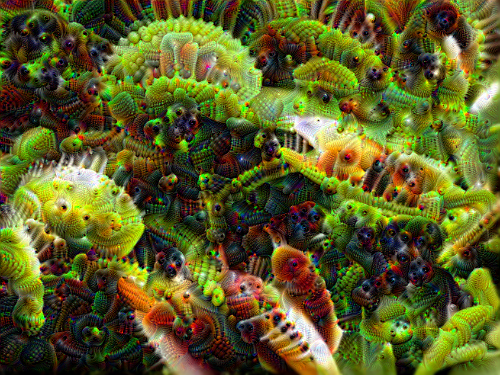

271.23355174064636

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, None, None, 3 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, None, None, 3 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

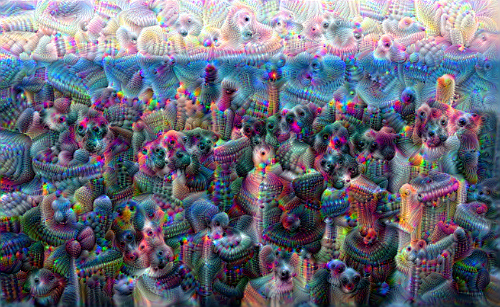

226.20457458496094

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

I think these models aare really interesting and create a very 'biological' look. I think it suits the Venus Fly trap a lot.

<b><h4>Xception</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')
base_model.summary()

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_8[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['block1_conv1']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

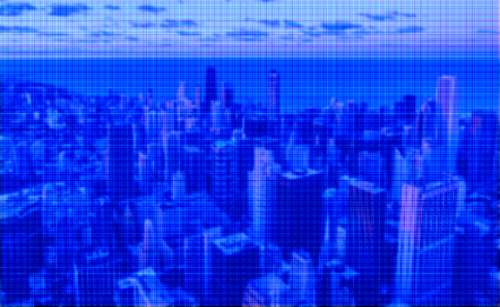

3.146927833557129

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

To me Xception, at least at a lower value, really makes the images look retro, which works well for the city and the paitning begins to look like it is underwater or in space.

<b><h4>MobileNet</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')
base_model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 

In [ ]:
# Maximize the activations of these layers
names = ['conv_pw_9', 'conv_pw_8']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

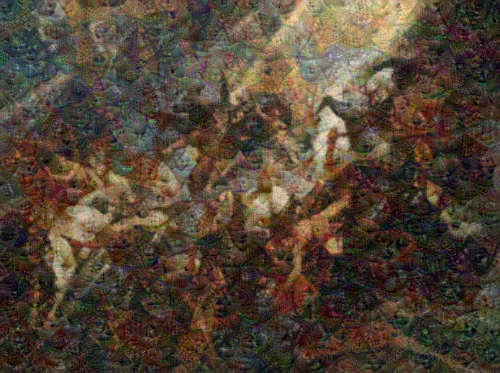

109.73373031616211

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

This algorithm is one of my favourites. The products remind me of cubism and it almost transforms the last fine art piece from classical to cubism, which would be a very interesting use for DeepDream.

<b><h4>DenseNet121</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.densenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.DenseNet121(include_top=False, weights='imagenet')
base_model.summary()

Model: "densenet121"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, None, None, 3 0           input_17[0][0]                   
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['conv2_block1_1_conv']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

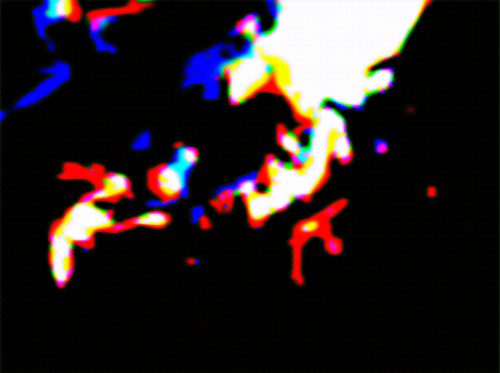

41.249926805496216

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The images are quite blurred so they are not longer what they used to be. I think it works best for the city image, the venus fly trap is too blurry, and the art piece is interesting but there is a lot of black.

<b><h4>ResNet50</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.resnet50.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.ResNet50(include_top=False, weights='imagenet')
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_23[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['conv2_block1_0_conv']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

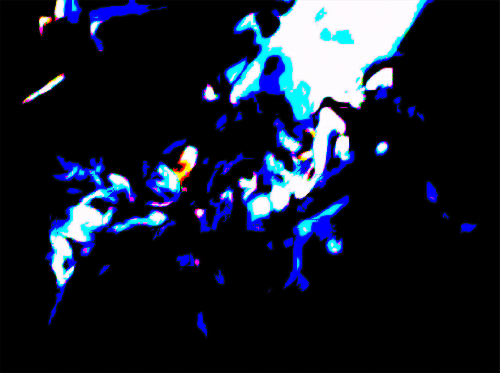

40.785926818847656

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

I really like the last image (the art one). The colours look like a blue fire, or the city looks like it has very old school graphics.

<b><h4>Overview</h4></b>

As this is a preference, overall my favourites and the ones used will be:

Natural image: InceptionV3 (works well with the natural image)

Urban image: Xception (might be able to make it interesting like an old graphics image)

Art image: MobileNet (might be a cool novel application)

<b><h1>Layers</h1></b>

The top/upper layers should produce more geometric outputs, while the lower layers produce more abstract or biological shapes. I will try test at least one case with lower, one case with upper, and a combination or midpoint. The combination may not be done if one of the effects looks better (e.g. geometric). Then I will explore more around that point. 

<b><h4>Image 1 (Natural image – Venus Fly Trap)</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_400 (Conv2D)             (None, None, None, 3 864         input_25[0][0]                   
__________________________________________________________________________________________________
batch_normalization_400 (BatchN (None, None, None, 3 96          conv2d_400[0][0]                 
__________________________________________________________________________________________________
activation_636 (Activation)     (None, None, None, 3 0           batch_normalization_400[0][0]    
_______________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['mixed2', 'mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

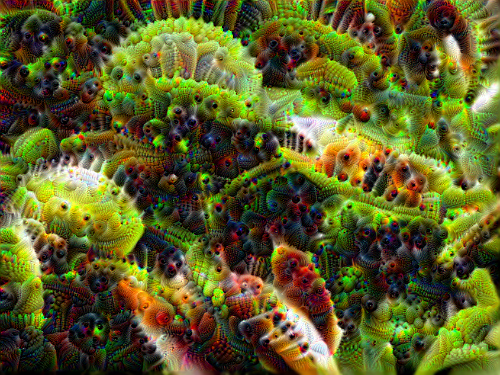

266.1208989620209

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Using non-Concatenate layers makes this algorithm blurry (tried uding Conv2D, as it worked for some of the others and created very interesting effects).

Including the last layers also turns this algorithm quite boring, while the top layers are more interesting.

<b><h4>Image 2 (Urban image – City)</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')
base_model.summary()

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 3 864         input_26[0][0]                   
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, None, None, 3 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, None, None, 3 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [ ]:
# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

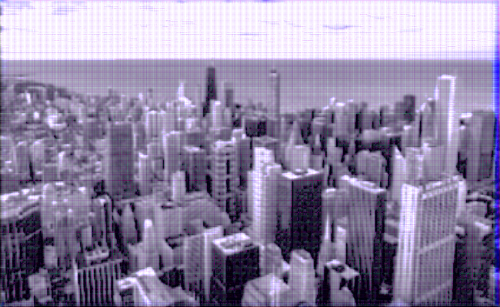

12.04287314414978

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The upper layers make the image look like it is black and white or it is a little retro. The lower layers make the image look like it is drawn. The upper layers for this example make the image look almost like an old camera has some errors or the video is a little corrupted.

<b><h4>Image 3 (Artistic image –The Fall Of Phaeton)</h4></b>

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')
base_model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 

In [ ]:
# Maximize the activations of these layers
names = ['conv_pw_9', 'conv_pw_10', 'conv_pw_11']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

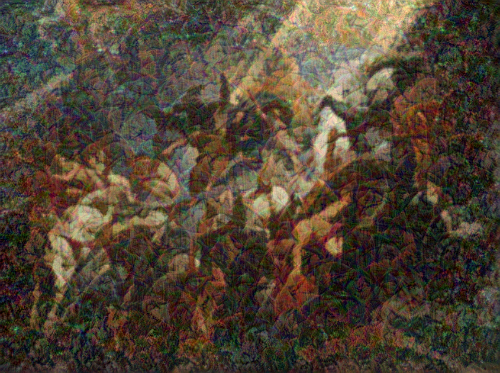

124.72214221954346

In [ ]:
start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The lower layers make the image look like the cubism trend, while the upper layers exadurate the colour pink/red. Using the middle elements, there appear many swirls and make the image almost unreadable from the input image.

<b><h4>Overview</h4></b>

My favourites and the ones used will be:

Natural image: mixed3, mixed5 (the first one created when experimenting with covnet types)

Urban image: block1_conv1, block1_conv2

Art image: conv_pw_11, conv_pw_12, con_pw_13 

<b><h1>Octave scale</h1></b>

<b><h4>Image 1 (Natural image – Venus Fly Trap)</h4></b>

We will no longer need the base_model.summary() as the layers have been chosen. We can therefore, now concatenate even further and make the code even more easy to run multiple times (by putting it in one block).

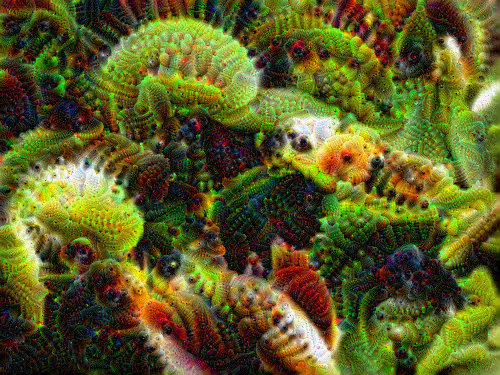

909.1170997619629

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 2.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

A very low scale makes the image blurry, a very large scale changes it too much from the original (you can almost see a chameleon form). Using around 1.0 is perfect as it makes it clearer and interesting

<b><h4>Image 2 (Urban image – City)</h4></b>


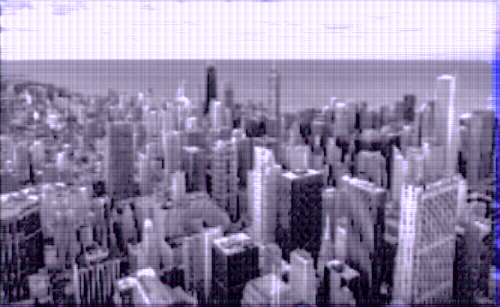

17.433922052383423

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.50

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Again, using the scale of 1.0 makes the image clearer and even like a camera. Using higher, makes it look more blurry and almost like a game render (older game).

<b><h4>Image 3 (Artistic image –The Fall Of Phaeton)</h4></b>

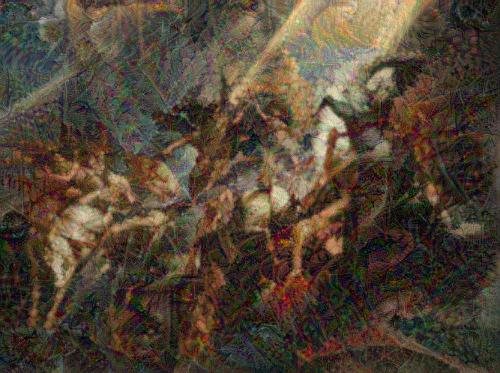

212.11888074874878

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.50

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The scale as 1.0 makes the image too clear and takes away from the cubism. Scale 1.50 does not look as nice as 1.30 in the image (1.50 can be made out a little too much). 

<b><h4>Overview</h4></b>

My favourites and the ones used will be:

Natural image: 1.0

Urban image: 1.0

Art image: 1.30

<b><h1>Step size</h1></b>



<b><h4>Image 1 (Natural image – Venus Fly Trap)</h4></b>

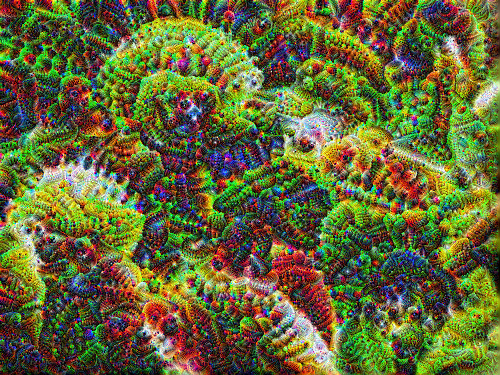

919.5006318092346

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 2.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.03)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Eventhough I accidently used the wrong octave scale, the image took too long to process and was too messy for 0.03. Using the value 0.008 made the image is the same as 0.01, and takes the same time to run (maybe 0.008 is even a little better).

<b><h4>Image 2 (Urban image – City)</h4></b>

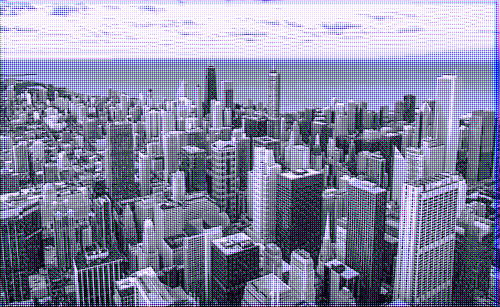

11.460044622421265

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.009)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

0.02 becomes too grainy, and 0.008 is quite good and a little clearer. I think 0.009 is the best midpoint to use.

<b><h4>Image 3 (Artistic image –The Fall Of Phaeton)</h4></b>

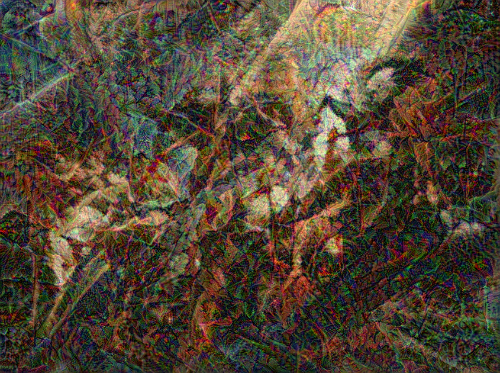

137.74821877479553

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.02)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Using 0.02 makes the image the brightest and now it even looks wrinkled. It even looks like cubism but with a lot of detail so I think this is working as one of the best images so far.

<b><h4>Overview</h4></b>

My favourites and the ones used will be:

Natural image: 0.008

Urban image: 0.009

Art image: 0.02

<b><h1>Steps</h1></b>



<b><h4>Image 1 (Natural image – Venus Fly Trap)</h4></b>

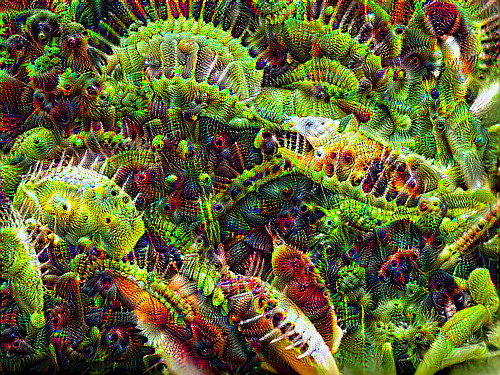

402.3557391166687

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=100, step_size=0.008)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Going upto the steps of 100, the image because more 'in depth' as there are more features. 100 looks the best, with 60 being close to it. 

<b><h4>Image 2 (Urban image – City)</h4></b>

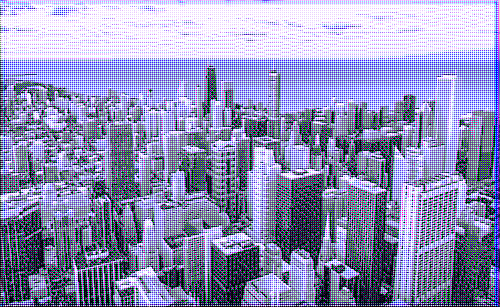

17.697973489761353

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=30, step_size=0.009)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

The higher the number of layers, the more pixelated is the image. I tried going with less layers (even less than the 20 used, it was used from when the blue was too much for 50 steps). I think 20 steps however, is best as it makes it look like a grainy photo.

<b><h4>Image 3 (Artistic image –The Fall Of Phaeton)</h4></b>

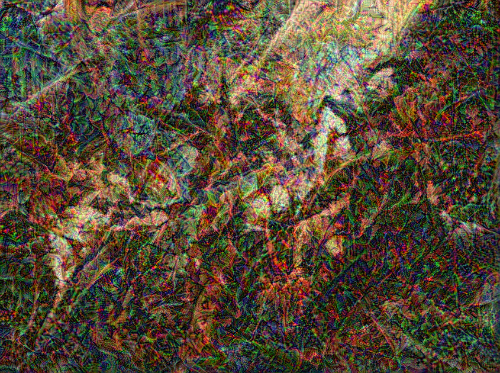

376.9001383781433

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=100, step_size=0.02)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Eventhough, 100 steps makes the image intense and cool, it becomes almost unseen. Using 20 steps actually makes it smoother and makes it look better for the overall and a little closer to cubism/the original.

<b><h4>Overview</h4></b>

My favourites and the ones used will be:

Natural image: 100

Urban image: 20

Art image: 20

<b><h1>Black and White</h1></b>

Just for an extra check, I used https://online-photo-converter.com/black-and-white-image to convert the 3 photos into black and white. I will now use the finalised models to also train them and see the results (out of curiosity).

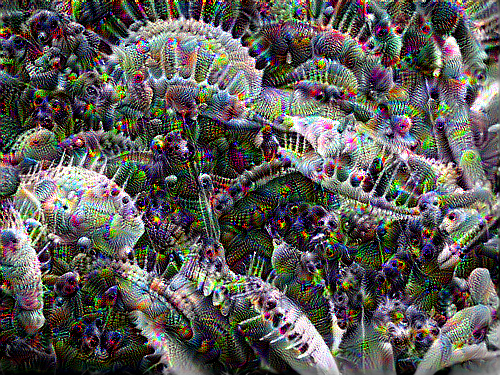

402.46393060684204

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFlyBW.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=100, step_size=0.008)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

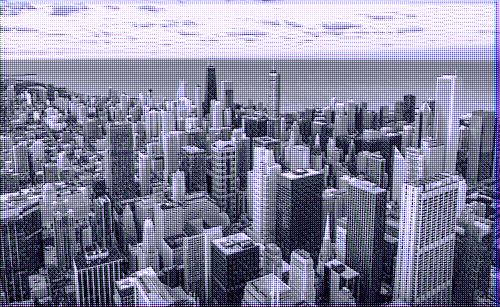

9.521480321884155

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/cityBW.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.009)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

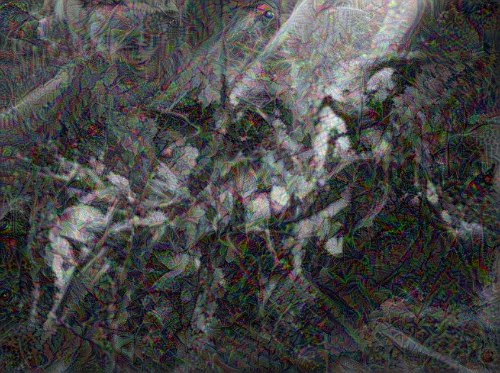

63.48162531852722

In [ ]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaetonBW.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.02)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

Overall the natural and artistic model is quite interesting, while the urban model performs similar to a coloured image. Also, to point out in the natural algorithm the colour green and red (along with others) still appear when no colour was present at first.

<b><h1>Final Pieces</h1></b>

I am very happy with the outcomes I have produced. The exploration really allowed me to understand the code, and therefore, I was able to manipulate it to my liking. I think my favourite would be algorithm 3, but they all bring something different. Natural makes the images very interesting and like a dream. Urban makes them like an old photograph and it has an effect where the smaller the image the more purple it becomes. Artistic makes images quite close to the cubism style (or even wrinkled paper effect) which was its intention. 

They will be run one more time and results displayed here and in the pdf with all of the produced images (too many for colab it would have been too many examples and be too messy to read the notebook).

I will also run some other images (also gotten from https://pixabay.com/) with the models to see how they would perform and to get an idea if they would be usuable for other images.

Whatever the outcome becomes, I am happy with the reuslts of the 3 images and my gained understanding.

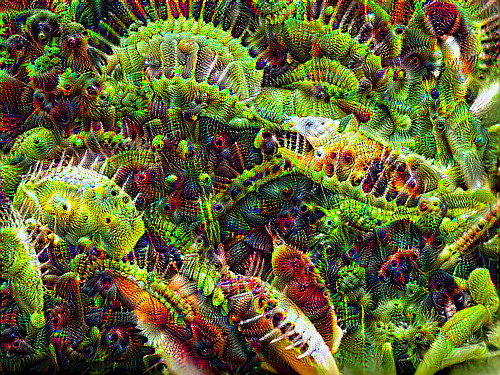

402.17784214019775

In [172]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/venusFly.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=100, step_size=0.008)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

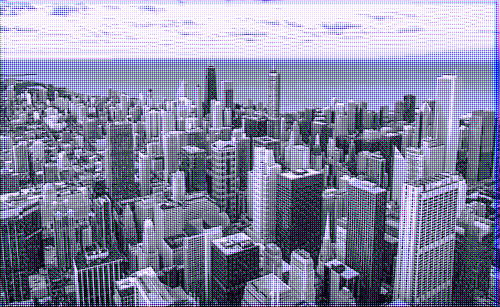

9.684582948684692

In [173]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.xception.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/city.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['block1_conv1', 'block1_conv2']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.009)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

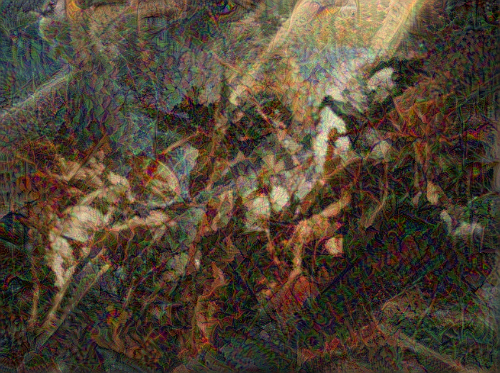

62.32569599151611

In [174]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/theFallOfPhaeton.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.02)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

<b><h1>Extra</h1></b>

Running some images the networks were not trained with. Most will be in the pdf of all images.

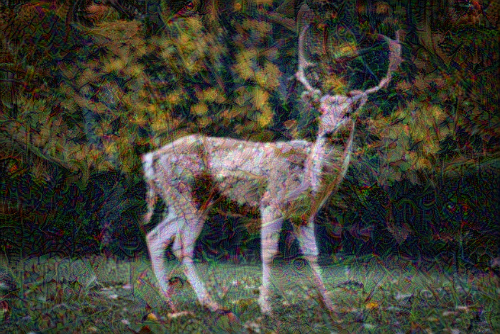

57.86771893501282

In [178]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.mobilenet.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/deer.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.MobileNet(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['conv_pw_11', 'conv_pw_12', 'conv_pw_13']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.30

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=20, step_size=0.02)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

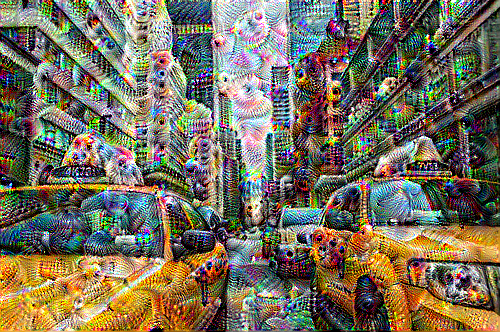

360.62330865859985

In [179]:
# The fuction needs to be here as you have to change the convet here too
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))

    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))

  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

url = 'https://github.com/SimasCes/DeepDream/blob/main/taxi.jpg?raw=true'
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)

# Define the model and then see a summary table
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

# Maximize the activations of these layers
names = ['mixed3', 'mixed5']
layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

deepdream = DeepDream(dream_model)

start = time.time()

OCTAVE_SCALE = 1.0

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-2, 3):
  new_shape = tf.cast(float_base_shape*(OCTAVE_SCALE**n), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=100, step_size=0.008)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

I think the styles have worked, and there are interesting results when trying a natural image with artistic, or an urban image with natural...